# Task 0. Preparation

Often, given a set of images, we are required to segment out regions/labels before further analysis of our data.

We are given 10 consecutive ‘axial’ cross-sections of a publicly available MRI of a single human subject and are required to segment out 5 tissue layers. Specifically, a single file, ‘Brain.mat’, which contains T1 weighted MRI images (each slice has a dimension of 362*434 pixel) with each z-slice being at 1 mm interval (spanning 10 mm). 

Additionally, we are given a ‘pre-segmented’ set of the same data GT to allow comparison and analysis (ground truth).

- Label 0 = air
- Label 1 = skin/scalp
- Label 2 = skull
- Label 3 = CSF
- Label 4 = Gray Matter
- Label 5 = White Matter

## 1. Install dependencies and import modules

In [1]:
import time
from scipy.io import loadmat
%matplotlib inline
from utils import *

## 2. Load the data

In [2]:
mri_data = loadmat('Brain.mat')
T1 = mri_data['T1'] # T1 original, np.array   
GT = mri_data['label'] # Ground Truth (manual segmentation), np.array
T1.shape, GT.shape

((362, 434, 10), (362, 434, 10))

## 3. Visualise

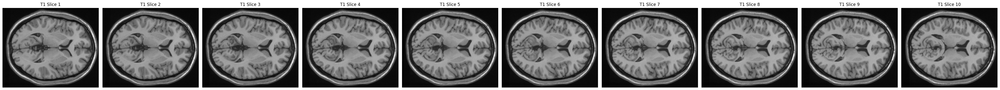

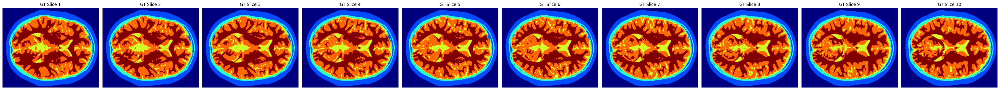

In [3]:
visualize_row(T1, cap='T1', cmap='gray')
visualize_row(GT, cap='GT')

# Task 1: 2D Tissue Segmentation

Develop several 2D-algorithms for brain MRI segmentation using traditional computer vision techniques.

## Approach 1 (Morphological Chan Vese + Otsu Thresholding + K-Means)

In [4]:
def A1(T1=T1):
    
    time_start_A1 = time.time()

    # Step 1: Separation of 0,1,2 and 3,4,5 regions
    T1_brain_mask = np.stack([chan_vese(T1[:, :, i])
                        for i in range(T1.shape[2])], axis=-1)
    T1_brain_mask = np.stack([close(T1_brain_mask[:, :, i])
                        for i in range(T1_brain_mask.shape[2])], axis=-1)
    T1_brain_mask = np.stack([area_close(T1_brain_mask[:, :, i], area_threshold=500)
                        for i in range(T1_brain_mask.shape[2])], axis=-1)
    T1_not_brain = blackout_pixels(T1, T1_brain_mask)
    T1_not_brain_mask = invert_binary(T1_brain_mask)
    T1_brain = blackout_pixels(T1, T1_not_brain_mask)

    # Step 2: Segmentation of 0,1,2 regions
    T1_0 = np.stack([multi_otsu_thresholding(T1[:, :, i], classes=2)
                        for i in range(T1.shape[2])], axis=-1)
    T1_0 = np.stack([area_close(T1_0[:, :, i], area_threshold=20000)
                        for i in range(T1_0.shape[2])], axis=-1)
    T1_0 = invert_binary(T1_0)
    T1_1 = np.stack([multi_otsu_thresholding(T1_not_brain[:, :, i], classes=2)
                        for i in range(T1_not_brain.shape[2])], axis=-1)
    T1_1_2 = blackout_pixels(T1_not_brain, T1_0)
    max_intensity = np.max(T1_1_2)
    T1_1_2 = raise_nonblack_pixels(T1_1_2, max_intensity)
    T1_1_2[T1_1_2 == max_intensity] = 1
    T1_0_1 = T1_1 + T1_0
    T1_0_1 = np.stack([area_close(T1_0_1[:, :, i], area_threshold = 500)
                        for i in range(T1_0_1.shape[2])], axis=-1)
    T1_1 = T1_0_1 - T1_0
    T1_2 = T1_1_2 - T1_1

    # Step 3: Segmentation of 3,4,5 regions
    T1_3_4_5 = np.stack([kmeans_segmentation(T1_brain[:, :, i], 4)
                        for i in range(T1_brain.shape[2])], axis=-1)
    T1_3_4_5_labels = np.unique(T1_3_4_5)[1:]
    T1_3 = (T1_3_4_5 == T1_3_4_5_labels[0]).astype(np.float32)
    T1_4 = (T1_3_4_5 == T1_3_4_5_labels[1]).astype(np.float32)
    T1_5 = (T1_3_4_5 == T1_3_4_5_labels[2]).astype(np.float32)

    # Step 4: Combination of segmented 0,1,2,3,4,5 regions
    T1_0_1_2_3_4_5_A1 = combine_regions(T1_0, T1_1, T1_2, T1_3, T1_4, T1_5)

    time_end_A1 = time.time()
    time_A1 = time_end_A1 - time_start_A1

    return T1_0_1_2_3_4_5_A1, time_A1

In [5]:
# times_A1 = []
# t = 5
# for i in range(t):
#     T1_0_1_2_3_4_5_A1, time_A1 = A1()
#     times_A1.append(time_A1)
# time_A1 = sum(times_A1)/t

T1_0_1_2_3_4_5_A1, time_A1 = A1()

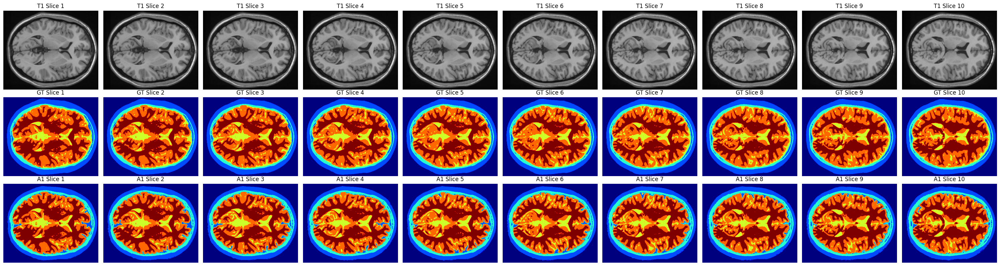

In [6]:
visualize_rows(T1, GT, T1_0_1_2_3_4_5_A1, 
                cap_1='T1', 
                cap_2='GT', 
                cap_3='A1', 
                cmap_1='gray')

## Approach 2 (Morphological Geodesic Active Contours + Otsu Thresholding + K-Means)

In [7]:
def A2(T1=T1):

    time_start_A2 = time.time()

    # Step 1: Separation of 0,1,2 and 3,4,5 regions
    T1_brain_mask = np.stack([geod_active_contour(T1[:, :, i])
                        for i in range(T1.shape[2])], axis=-1)
    T1_brain_mask = np.stack([close(T1_brain_mask[:, :, i])
                        for i in range(T1_brain_mask.shape[2])], axis=-1)
    T1_brain_mask = np.stack([area_close(T1_brain_mask[:, :, i], area_threshold=500)
                        for i in range(T1_brain_mask.shape[2])], axis=-1)
    T1_not_brain = blackout_pixels(T1, T1_brain_mask)
    T1_not_brain_mask = invert_binary(T1_brain_mask)
    T1_brain = blackout_pixels(T1, T1_not_brain_mask)

    # Step 2: Segmentation of 0,1,2 regions
    T1_0 = np.stack([multi_otsu_thresholding(T1[:, :, i], classes=2)
                        for i in range(T1.shape[2])], axis=-1)
    T1_0 = np.stack([area_close(T1_0[:, :, i], area_threshold=20000)
                        for i in range(T1_0.shape[2])], axis=-1)
    T1_0 = invert_binary(T1_0)
    T1_1 = np.stack([multi_otsu_thresholding(T1_not_brain[:, :, i], classes=2)
                        for i in range(T1_not_brain.shape[2])], axis=-1)
    T1_1_2 = blackout_pixels(T1_not_brain, T1_0)
    max_intensity = np.max(T1_1_2)
    T1_1_2 = raise_nonblack_pixels(T1_1_2, max_intensity)
    T1_1_2[T1_1_2 == max_intensity] = 1
    T1_0_1 = T1_1 + T1_0
    T1_0_1 = np.stack([area_close(T1_0_1[:, :, i], area_threshold = 500)
                        for i in range(T1_0_1.shape[2])], axis=-1)
    T1_1 = T1_0_1 - T1_0
    T1_2 = T1_1_2 - T1_1

    # Step 3: Segmentation of 3,4,5 regions
    T1_3_4_5 = np.stack([kmeans_segmentation(T1_brain[:, :, i], 4)
                        for i in range(T1_brain.shape[2])], axis=-1)
    T1_3_4_5_labels = np.unique(T1_3_4_5)[1:]
    T1_3 = (T1_3_4_5 == T1_3_4_5_labels[0]).astype(np.float32)
    T1_4 = (T1_3_4_5 == T1_3_4_5_labels[1]).astype(np.float32)
    T1_5 = (T1_3_4_5 == T1_3_4_5_labels[2]).astype(np.float32)

    # Step 4: Combination of segmented 0,1,2,3,4,5 regions
    T1_0_1_2_3_4_5_A2 = combine_regions(T1_0, T1_1, T1_2, T1_3, T1_4, T1_5)
    
    time_end_A2 = time.time()
    time_A2 = time_end_A2 - time_start_A2
    
    return T1_0_1_2_3_4_5_A2, time_A2

In [8]:
# times_A2 = []
# for i in range(t):
#     T1_0_1_2_3_4_5_A2, time_A2 = A2()
#     times_A2.append(time_A2)
# time_A2 = sum(times_A2)/t

T1_0_1_2_3_4_5_A2, time_A2 = A2()

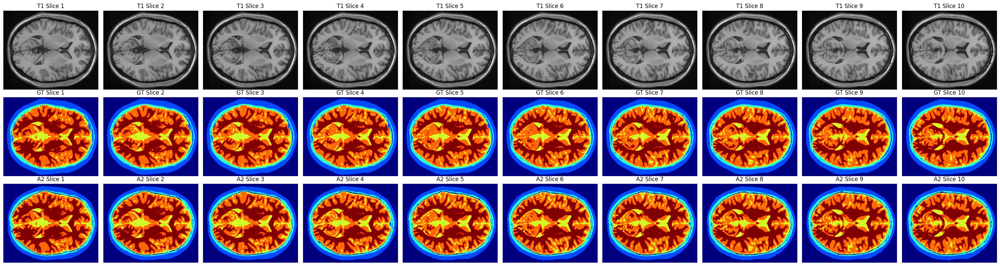

In [9]:
visualize_rows(T1, GT, T1_0_1_2_3_4_5_A2,
                cap_1='T1',
                cap_2='GT',
                cap_3='A2',
                cmap_1='gray')

## Approach 3 (Morphological Geodesic Active Contours + Otsu Thresholding + Multi-Otsu Thresholding)

In [10]:
def A3(T1=T1):

    time_start_A3 = time.time()

    # Step 1: Separation of 0,1,2 and 3,4,5 regions
    T1_brain_mask = np.stack([geod_active_contour(T1[:, :, i])
                        for i in range(T1.shape[2])], axis=-1)
    T1_brain_mask = np.stack([close(T1_brain_mask[:, :, i])
                        for i in range(T1_brain_mask.shape[2])], axis=-1)
    T1_brain_mask = np.stack([area_close(T1_brain_mask[:, :, i], area_threshold=500)
                        for i in range(T1_brain_mask.shape[2])], axis=-1)
    T1_not_brain = blackout_pixels(T1, T1_brain_mask)
    T1_not_brain_mask = invert_binary(T1_brain_mask)
    T1_brain = blackout_pixels(T1, T1_not_brain_mask)

    # Step 2: Segmentation of 0,1,2 regions
    T1_0 = np.stack([multi_otsu_thresholding(T1[:, :, i], classes=2)
                        for i in range(T1.shape[2])], axis=-1)
    T1_0 = np.stack([area_close(T1_0[:, :, i], area_threshold=20000)
                        for i in range(T1_0.shape[2])], axis=-1)
    T1_0 = invert_binary(T1_0)
    T1_1 = np.stack([multi_otsu_thresholding(T1_not_brain[:, :, i], classes=2)
                        for i in range(T1_not_brain.shape[2])], axis=-1)
    T1_1_2 = blackout_pixels(T1_not_brain, T1_0)
    max_intensity = np.max(T1_1_2)
    T1_1_2 = raise_nonblack_pixels(T1_1_2, max_intensity)
    T1_1_2[T1_1_2 == max_intensity] = 1
    T1_0_1 = T1_1 + T1_0
    T1_0_1 = np.stack([area_close(T1_0_1[:, :, i], area_threshold = 500)
                        for i in range(T1_0_1.shape[2])], axis=-1)
    T1_1 = T1_0_1 - T1_0
    T1_2 = T1_1_2 - T1_1

    # Step 3: Segmentation of 3,4,5 regions
    T1_3_4_5 = np.stack([multi_otsu_thresholding(T1_brain[:, :, i], classes=4)
                        for i in range(T1_brain.shape[2])], axis=-1)
    T1_3_4_5_labels = np.unique(T1_3_4_5)[1:]
    T1_3 = (T1_3_4_5 == T1_3_4_5_labels[0]).astype(np.float32)
    T1_4 = (T1_3_4_5 == T1_3_4_5_labels[1]).astype(np.float32)
    T1_5 = (T1_3_4_5 == T1_3_4_5_labels[2]).astype(np.float32)

    # Step 4: Combination of segmented 0,1,2,3,4,5 regions
    T1_0_1_2_3_4_5_A3 = combine_regions(T1_0, T1_1, T1_2, T1_3, T1_4, T1_5)

    time_end_A3 = time.time()
    time_A3 = time_end_A3 - time_start_A3
    
    return T1_0_1_2_3_4_5_A3, time_A3

In [11]:
# times_A3 = []
# for i in range(t):
#     T1_0_1_2_3_4_5_A3, time_A3 = A3(T1)
#     times_A3.append(time_A3)
# time_A3 = sum(times_A3)/t

T1_0_1_2_3_4_5_A3, time_A3 = A3(T1)

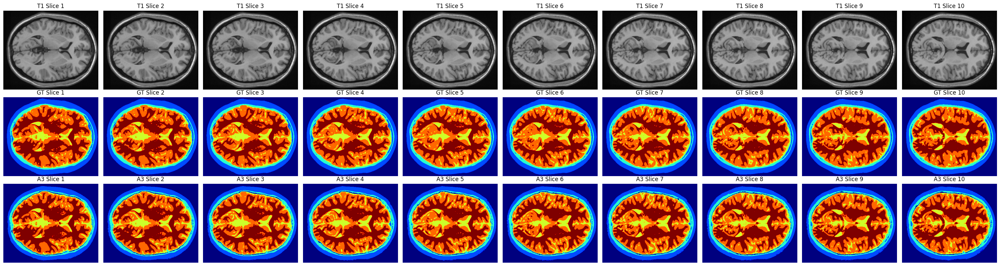

In [12]:
visualize_rows(T1, GT, T1_0_1_2_3_4_5_A3,
                cap_1='T1',
                cap_2='GT',
                cap_3='A3',
                cmap_1='gray')

# Task 2: 2D-Algorithm Evaluation

Comparison of the segmented results for each 2D-algorithm to the ground-truth labels provided.

## 1. Precision, Recall, F1-Score (Dice-Score)

In [21]:
print("Approach 1:")
compute_P_R_F1(T1_0_1_2_3_4_5_A1, GT)

print("\nApproach 2:")
compute_P_R_F1(T1_0_1_2_3_4_5_A2, GT)

print("\nApproach 3:")
compute_P_R_F1(T1_0_1_2_3_4_5_A3, GT)

Approach 1:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97    426950
           1       0.86      0.79      0.82    235461
           2       0.73      1.00      0.84     93803
           3       0.72      0.58      0.64    106140
           4       0.99      0.90      0.94    384991
           5       0.96      1.00      0.98    323735

    accuracy                           0.91   1571080
   macro avg       0.87      0.88      0.87   1571080
weighted avg       0.92      0.91      0.91   1571080


Approach 2:
              precision    recall  f1-score   support

           0       0.90      1.00      0.95    426950
           1       1.00      0.78      0.87    235461
           2       0.75      0.74      0.74     93803
           3       0.80      0.95      0.87    106140
           4       0.99      0.90      0.94    384991
           5       0.94      1.00      0.97    323735

    accuracy                           0.92   157108

## 2. Jaccard-Index (Intersection over Union)

In [ ]:
# Note, we use weighted average when computing overall score to account for class disbalance (e.g. region 3)
print("Approach 1:")
for region, score in compute_jaccard(T1_0_1_2_3_4_5_A1, GT, average='weighted').items():
    print(f"{region}: {round(score, 3)}")

print("\nApproach 2:")
for region, score in compute_jaccard(T1_0_1_2_3_4_5_A2, GT, average='weighted').items():
    print(f"{region}: {round(score, 3)}")

print("\nApproach 3:")
for region, score in compute_jaccard(T1_0_1_2_3_4_5_A3, GT, average='weighted').items():
    print(f"{region}: {round(score, 3)}")

Approach 1:
Region 0: 0.937
Region 1: 0.7
Region 2: 0.732
Region 3: 0.471
Region 4: 0.889
Region 5: 0.957
Overall: 0.85

Approach 2:
Region 0: 0.9
Region 1: 0.774
Region 2: 0.593
Region 3: 0.769
Region 4: 0.895
Region 5: 0.943
Overall: 0.862

Approach 3:
Region 0: 0.899
Region 1: 0.774
Region 2: 0.593
Region 3: 0.775
Region 4: 0.888
Region 5: 0.933
Overall: 0.858


## 3. Time Efficiency (Average over 5)

In [ ]:
# To estimate efficiency, we run each approach 5 times on MacBook M3 Pro
print(f"Approach 1: {round(time_A1, 2)} sec")
print(f"Approach 2: {round(time_A2, 2)} sec")
print(f"Approach 3: {round(time_A3, 2)} sec")

Approach 1: 56.86 sec
Approach 2: 62.27 sec
Approach 3: 60.66 sec


## 4. Visualization

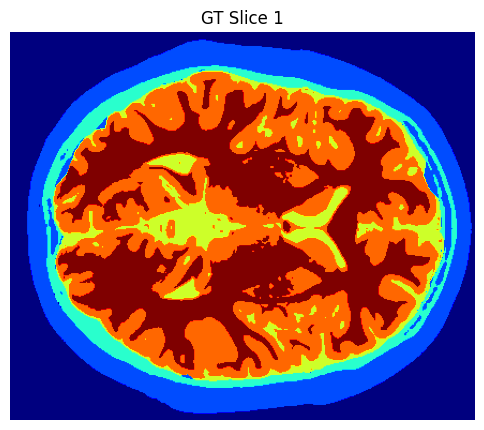

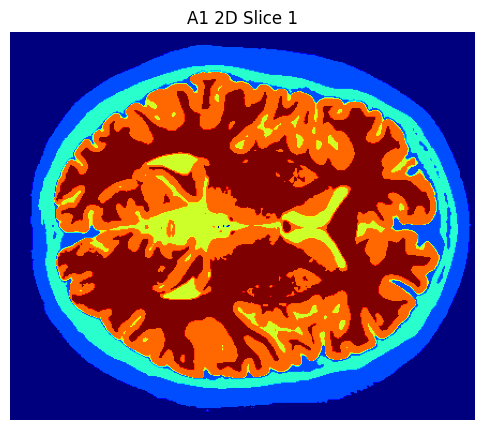

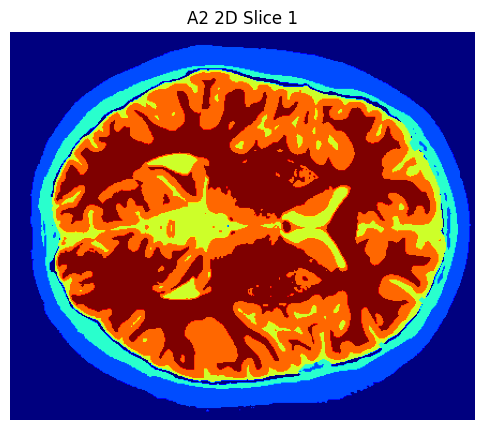

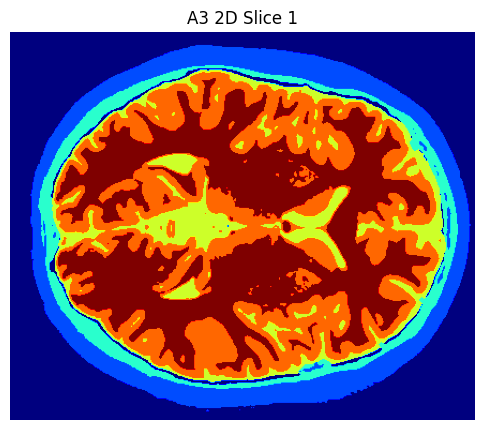

In [14]:
# 1st Slice

visualize_slice(GT, cap='GT')
visualize_slice(T1_0_1_2_3_4_5_A1, s=0, cap='A1 2D')
visualize_slice(T1_0_1_2_3_4_5_A2, s=0, cap='A2 2D')
visualize_slice(T1_0_1_2_3_4_5_A3, s=0, cap='A3 2D')

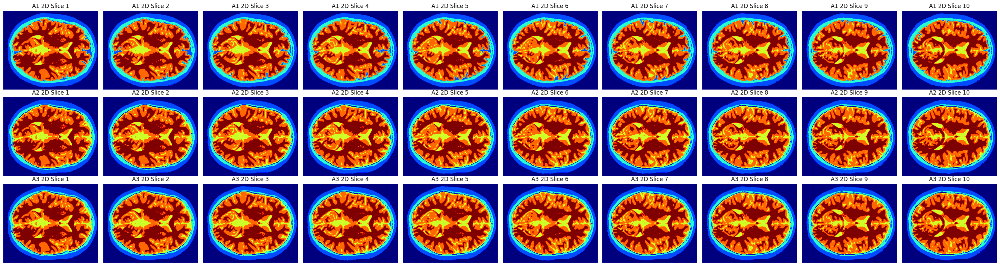

In [13]:
# Per-Slice

visualize_rows(T1_0_1_2_3_4_5_A1, T1_0_1_2_3_4_5_A3, T1_0_1_2_3_4_5_A2,
                cap_1='A1 2D',
                cap_2='A2 2D',
                cap_3='A3 2D')

## 5. Conclusions

### Approach 1 vs. Approach 2

The choice of **Morphological Geodesic Active Contours (MGAC)** in Approach 2 over **Morphological Chan Vese (MCV)** in Approach 1 resulted in large improvement in segmentation of 3 region, as the 3 region has a distinct gradient at its border that MGAC exploits. However, both Approach 1 and Approach 2 use K-Means which depends on centroid initialization, which may be less reliable in certain cases.

### Approach 2 vs. Approach 3

In Approach 3, we change **K-Means** part to **Multi-Outsu Thresholding**. Approach 2 and Approach 3 haven't demonstrated any difference in performance based on **F1-score**, so we employed **Jaccard-Index**, which is a stricter measure, which showed that **K-Means** performs slightly better in **4th** and **5th** regions. In order to determine the best algorithm computational efficiency was also assessed, which is a practically significant consideration, especially to choose the best candidate to be applied in 3D.

For Approach 2 the average execution time (measured 5 times, Macbook M3 Pro) was **62.27** seconds, while for Approach 3 the average execution time was **60.66** seconds, since **Multi-Outsu Thresholding** (histogram-based O(n) over bins) is faster than **K-Means** (iterative, multiple passes over all pixels). 

### Summary
1. **Approaches 2 and 3** showed similar results on **F1-Score**
2. **Approach 2** sligthly wins on **Jaccard-Index**
3. **Approach 3** is a bit faster.

Winner is unclear, so we try applying both approaches in 3D.

# Task 3: Advanced 3D Tissue Segmentation

Adapt best algorithms from 2D brain MRI segmentation task to 3D brain MRI segmentation problem where they are applied to all slices, simultaneously. 

## Approach 2 *3D* (Morphological Geodesic Active Contours + Otsu Thresholding + K-Means)

In [15]:
def A2_3D(T1=T1):

    time_start_A2_3D = time.time()

    #Step 1: Separation of 0,1,2 and 3,4,5 regions
    T1_brain_mask = geod_active_contour(T1)
    T1_brain_mask = close(T1_brain_mask)
    T1_brain_mask = area_close(T1_brain_mask, area_threshold=500*10)
    T1_not_brain = blackout_pixels(T1, T1_brain_mask)
    T1_not_brain_mask = invert_binary(T1_brain_mask)
    T1_brain = blackout_pixels(T1, T1_not_brain_mask)

    #Step 2: Segmentation of 0,1,2 regions
    T1_0 = multi_otsu_thresholding(T1, classes=2)
    T1_0 = area_close(T1_0, area_threshold=20000*10)
    T1_0 = invert_binary(T1_0)
    T1_1 = multi_otsu_thresholding(T1_not_brain, classes=2)
    T1_1_2 = blackout_pixels(T1_not_brain, T1_0)
    max_intensity = np.max(T1_1_2)
    T1_1_2 = raise_nonblack_pixels(T1_1_2, max_intensity)
    T1_1_2[T1_1_2 == max_intensity] = 1
    T1_0_1 = T1_1 + T1_0
    T1_0_1 = area_close(T1_0_1, area_threshold = 500*10)
    T1_1 = T1_0_1 - T1_0
    T1_2 = T1_1_2 - T1_1

    #Step 3: Segmentation of 3,4,5 regions
    T1_3_4_5 = kmeans_segmentation(T1_brain, 4)
    T1_3_4_5_labels = np.unique(T1_3_4_5)[1:]
    T1_3 = (T1_3_4_5 == T1_3_4_5_labels[0]).astype(np.float32)
    T1_4 = (T1_3_4_5 == T1_3_4_5_labels[1]).astype(np.float32)
    T1_5 = (T1_3_4_5 == T1_3_4_5_labels[2]).astype(np.float32)

    #Step 4: Combination of segmented 0,1,2,3,4,5 regions
    T1_0_1_2_3_4_5_A2_3D = combine_regions(T1_0, T1_1, T1_2, T1_3, T1_4, T1_5)

    time_end_A2_3D = time.time()
    time_A2_3D = time_end_A2_3D - time_start_A2_3D

    return T1_0_1_2_3_4_5_A2_3D, time_A2_3D

In [16]:
T1_0_1_2_3_4_5_A2_3D, time_A2_3D = A2_3D()

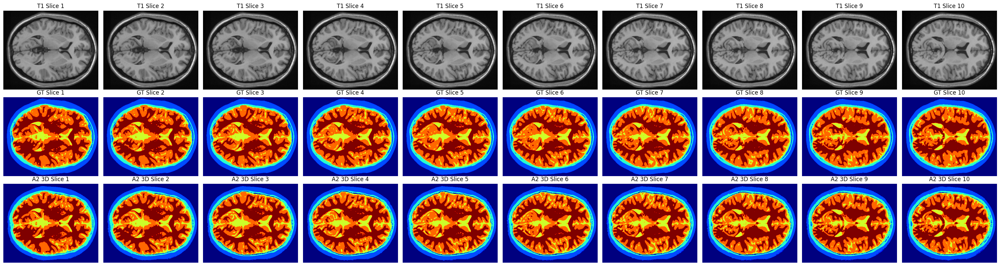

In [17]:
visualize_rows(T1, GT, T1_0_1_2_3_4_5_A2_3D, 
                cap_1='T1',
                cap_2='GT',
                cap_3='A2 3D',
                cmap_1='gray')

## Approach 3 *3D* (Morphological Geodesic Active Contours + Otsu Thresholding + Multi-Otsu Thresholding)

In [18]:
def A3_3D(T1=T1):

    time_start_A3_3D = time.time()

    #Step 1: Separation of 0,1,2 and 3,4,5 regions
    T1_brain_mask = geod_active_contour(T1)
    T1_brain_mask = close(T1_brain_mask)
    T1_brain_mask = area_close(T1_brain_mask, area_threshold=500*10)
    T1_not_brain = blackout_pixels(T1, T1_brain_mask)
    T1_not_brain_mask = invert_binary(T1_brain_mask)
    T1_brain = blackout_pixels(T1, T1_not_brain_mask)

    #Step 2: Segmentation of 0,1,2 regions
    T1_0 = multi_otsu_thresholding(T1, classes=2)
    T1_0 = area_close(T1_0, area_threshold=20000*10)
    T1_0 = invert_binary(T1_0)
    T1_1 = multi_otsu_thresholding(T1_not_brain, classes=2)
    T1_1_2 = blackout_pixels(T1_not_brain, T1_0)
    max_intensity = np.max(T1_1_2)
    T1_1_2 = raise_nonblack_pixels(T1_1_2, max_intensity)
    T1_1_2[T1_1_2 == max_intensity] = 1
    T1_0_1 = T1_1 + T1_0
    T1_0_1 = area_close(T1_0_1, area_threshold = 500*10)
    T1_1 = T1_0_1 - T1_0
    T1_2 = T1_1_2 - T1_1

    #Step 3: Segmentation of 3,4,5 regions
    T1_3_4_5 = multi_otsu_thresholding(T1_brain, classes=4)
    T1_3_4_5_labels = np.unique(T1_3_4_5)[1:]
    T1_3 = (T1_3_4_5 == T1_3_4_5_labels[0]).astype(np.float32)
    T1_4 = (T1_3_4_5 == T1_3_4_5_labels[1]).astype(np.float32)
    T1_5 = (T1_3_4_5 == T1_3_4_5_labels[2]).astype(np.float32)

    #Step 4: Combination of segmented 0,1,2,3,4,5 regions
    T1_0_1_2_3_4_5_A3_3D = combine_regions(T1_0, T1_1, T1_2, T1_3, T1_4, T1_5)

    time_end_A3_3D = time.time()
    time_A3_3D = time_end_A3_3D - time_start_A3_3D

    return T1_0_1_2_3_4_5_A3_3D, time_A3_3D

In [19]:
T1_0_1_2_3_4_5_A3_3D, time_A3_3D = A3_3D()

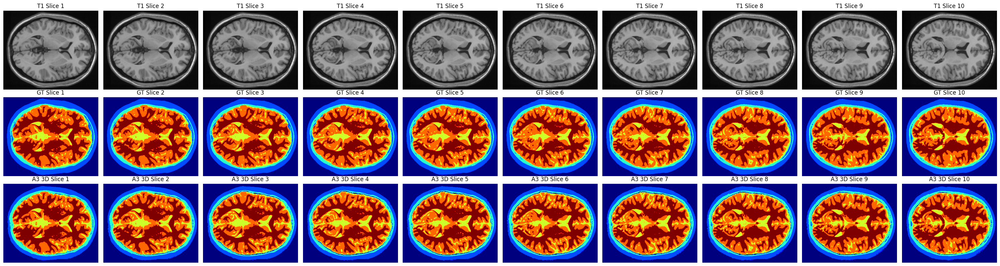

In [20]:
visualize_rows(T1, GT, T1_0_1_2_3_4_5_A3_3D, 
                cap_1='T1',
                cap_2='GT',
                cap_3='A3 3D',
                cmap_1='gray')

# Task 4. 3D-Algorithm Evaluation

Comparison of the segmented results for each 3D-algorithm to the ground-truth labels provided.

## 1. Precision, Recall, F1-Score (Dice-Score)

In [ ]:
print("Approach 2 3D:")
compute_P_R_F1(T1_0_1_2_3_4_5_A2_3D, GT)

print("\nApproach 3 3D:")
compute_P_R_F1(T1_0_1_2_3_4_5_A3_3D, GT)

Approach 2 3D:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95    426950
           1       1.00      0.77      0.87    235461
           2       0.76      0.78      0.77     93803
           3       0.80      0.96      0.87    106140
           4       0.99      0.91      0.95    384991
           5       0.95      1.00      0.97    323735

    accuracy                           0.93   1571080
   macro avg       0.90      0.90      0.90   1571080
weighted avg       0.93      0.93      0.93   1571080


Approach 3 3D:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95    426950
           1       1.00      0.77      0.87    235461
           2       0.76      0.78      0.77     93803
           3       0.81      0.96      0.88    106140
           4       0.99      0.90      0.94    384991
           5       0.94      1.00      0.97    323735

    accuracy                           0.93   

## 2. Jaccard-Index (Intersection over Union)

In [34]:
print("Approach 2 3D:")
for region, score in compute_jaccard(T1_0_1_2_3_4_5_A2_3D, GT, average='weighted').items():
    print(f"{region}: {round(score, 3)}")

print("\nApproach 3 3D:")
for region, score in compute_jaccard(T1_0_1_2_3_4_5_A3_3D, GT, average='weighted').items():
    print(f"{region}: {round(score, 3)}")

Approach 2 3D:
Region 0: 0.906
Region 1: 0.771
Region 2: 0.627
Region 3: 0.774
Region 4: 0.898
Region 5: 0.947
Overall: 0.867

Approach 3 3D:
Region 0: 0.905
Region 1: 0.771
Region 2: 0.627
Region 3: 0.778
Region 4: 0.895
Region 5: 0.943
Overall: 0.865


## 3. Time Efficiency

In [35]:
print(f"Approach 2 3D: {round(time_A2_3D, 2)}")
print(f"Approach 3 3D: {round(time_A3_3D, 2)}")

Approach 2 3D: 144.69
Approach 3 3D: 141.11


## 4. Visualization

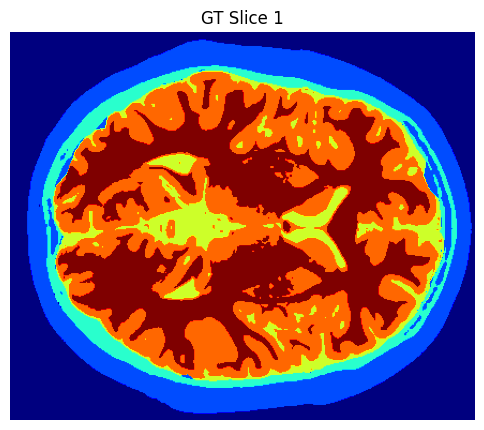

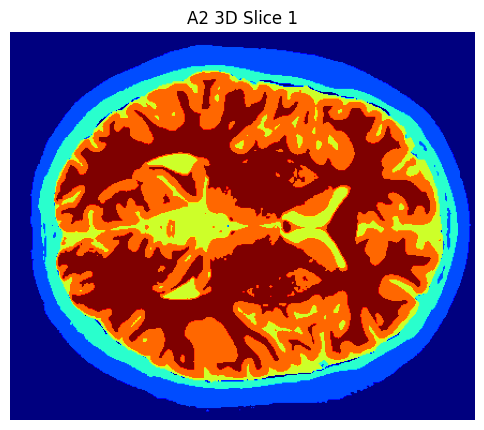

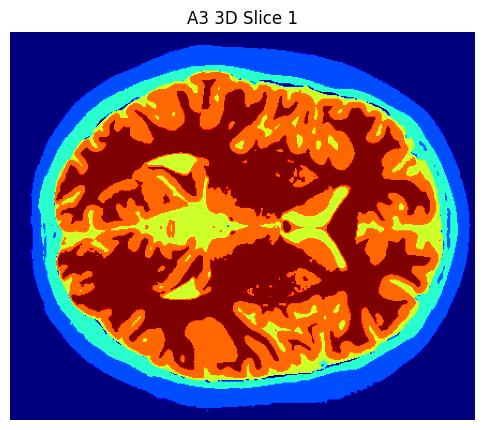

In [21]:
# 1st Slice Comparison (A2 3D vs. A3 3D)

visualize_slice(GT, cap='GT')
visualize_slice(T1_0_1_2_3_4_5_A2_3D, s=0, cap='A2 3D')
visualize_slice(T1_0_1_2_3_4_5_A3_3D, s=0, cap='A3 3D')

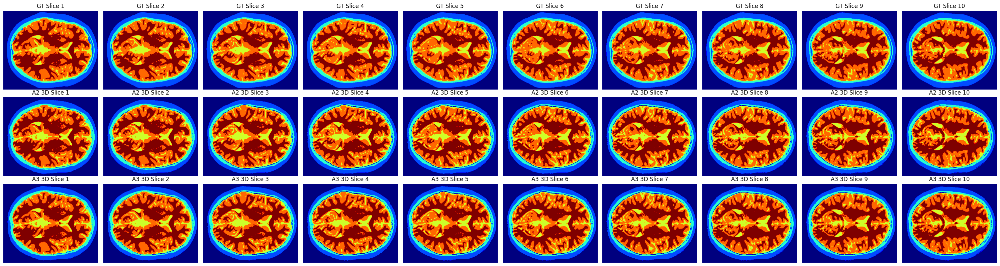

In [22]:
# Per-Slice Comparison

visualize_rows(GT, T1_0_1_2_3_4_5_A2_3D, T1_0_1_2_3_4_5_A3_3D,
                cap_1='GT',
                cap_2='A2 3D',
                cap_3='A3 3D')

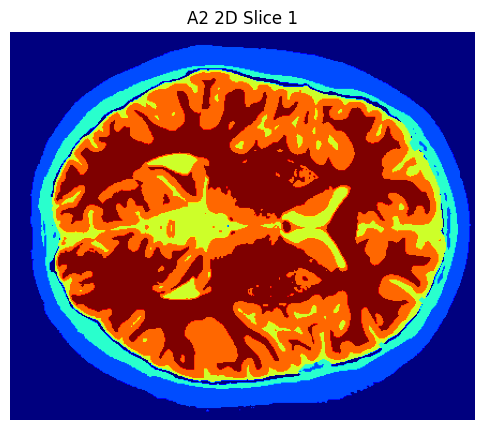

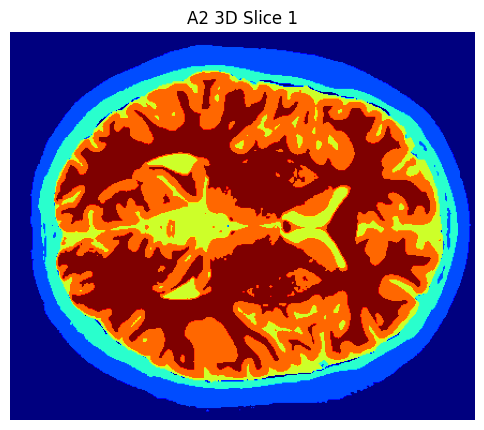

In [23]:
# 1st Slice Comparison (A2 2D vs. A2 3D)

visualize_slice(T1_0_1_2_3_4_5_A2, s=0, cap='A2 2D')
visualize_slice(T1_0_1_2_3_4_5_A2_3D, s=0, cap='A2 3D')

## 5. Conclusions

### Approach 2 3D vs. Approach 3 3D:

Overall, when applied to 3D both Approaches performed well, with **Approach 2** slightly outperforming in several regions based on **F1-Score** and **Jaccard-Index** and Approach 3 being faster.

### Approaches 2D vs. 3D:

Due to leverage of inter-slice continuity, approaches applied in 3D, perform better than the ones in 2D, so even in the challenging 2 region - where its intensity overlaps with 0 region - the additional spatial context helps refine the boundary delineation. 

However, adapting and tuning algorithms for 3D can be more complex, especially if inter-slice alignment is imperfect (this is where the advantage of the chosen focus for robustness in 2D starts to
matter). 

Moreover, although the spatial context helps to reduce slice-to-slice variability, it may be a double edge sword—any segmentation errors can propagate across the volume.

Finally, it comes at a cost of 2.33x longer execution (e.g. Approach 2).

### Summary

1. For **better results** - in our case, **K-Means** showed better results in segmentation of 3,4,5 regions. For **speed** (which will become even more noticable depending on hardware and number of MRI sets) - in our case, **Multi-Otsu Thresholding** for 3,4,5 regions was faster.
2. Approaches in 3D utilize inter-slice continuity and **produce better results**, epecially for problematic regions, while may be **harder to tune**, decrease performance **if the mismatches between slices** are larger, and take **longer time for execution**.

